# Neurodesk Tools Demo
## Shell We Begin?


Welcome to this Neurodesk demonstration notebook - a guide to the rich ecosystem of tools, workflows, and visualization strategies available on the Neurodesk platform. From command-line tools and pipelines to modular Python interfaces, this notebook provides an overview of setting up pipelines, running individual processing steps, and inspecting outputs, from shell and cell.

Use this notebook to:
- Explore a selection of popular neuroimaging tools (e.g., FSL, AFNI, FreeSurfer, MRIQC)
- Learn how to run CLI-based commands, set up workflows, and execute Pythonic processing steps interactively
- Visualize outputs and quality control reports directly in the notebook
- Navigate to detailed, tool-specific notebooks for deeper exploration


**Author:** Monika Doerig

**Date:** 13 June 2025

**Citation:**
For clarity and conciseness, references and citations supporting each tool or workflow are included in the linked notebooks themselves.

## 1. Load software tools and import Python libraries

In [1]:
%%capture
!pip install fury==0.11.0 dipy==1.11.0 vtk==9.5.2 pybids==0.19.0 antspyx nilearn

In [2]:
import os
import nibabel as nib
from scipy import ndimage
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import transforms
import ants
from bids.layout import BIDSLayout, BIDSValidator
from ipyniivue import NiiVue
from IPython.display import Image, display
from IPython.core.display import SVG
from nipype.interfaces import fsl
from nipype.interfaces import afni
from dipy.core.gradients import gradient_table
from dipy.io import read_bvals_bvecs
from dipy.io.image import load_nifti
import dipy.reconst.dti as dti
from dipy.segment.mask import median_otsu
from dipy.data import get_sphere
from dipy.viz import actor, window
from nilearn.image.image import mean_img
from nilearn.plotting import plot_epi, plot_anat, plot_img, plot_roi, view_img

In [3]:
# We can use module to load the different software tools in a specific version
import module
await module.purge()
await module.load('afni/21.2.00')
await module.load('mriqc/24.0.2')
await module.load('ants/2.6.0')
await module.load('bidscoin/4.3.3')
await module.load('freesurfer/8.1.0')
await module.load('mrtrix3/3.0.4')
await module.load('fsl/6.0.7.16')
await module.list()

['afni/21.2.00',
 'mriqc/24.0.2',
 'ants/2.6.0',
 'bidscoin/4.3.3',
 'freesurfer/8.1.0',
 'mrtrix3/3.0.4',
 'fsl/6.0.7.16']

## 2. Data 

### Access Open Data on OSF Using DataLad
Note :This workflow requires the dataset to be available as a DataLad dataset on OSF (i.e. with DataLad metadata and annexed file storage).

In [4]:
# Download one subject of the Brain Tumor Connectomics Data in BIDS Format
PATTERN = "sub-CON02"
! datalad install https://github.com/OpenNeuroDatasets/ds001226.git

! cd ds001226 && datalad get $PATTERN

Cloning:   0%|                             | 0.00/2.00 [00:00<?, ? candidates/s]
Enumerating: 0.00 Objects [00:00, ? Objects/s]
                                              
Counting:   0%|                              | 0.00/25.9k [00:00<?, ? Objects/s]
                                                                                
Compressing:   0%|                           | 0.00/18.7k [00:00<?, ? Objects/s]
                                                                                
Receiving:   0%|                             | 0.00/25.9k [00:00<?, ? Objects/s]
Receiving:  46%|█████████▋           | 11.9k/25.9k [00:00<00:00, 117k Objects/s]
Receiving:  93%|███████████████████▌ | 24.1k/25.9k [00:00<00:00, 118k Objects/s]
                                                                                
Resolving:   0%|                              | 0.00/4.30k [00:00<?, ? Deltas/s]
[INFO   ] Remote origin not usable by git-annex; setting annex-ignore           
[INFO   ] https

## 3. Bits about BIDS


### BIDS conversion with BIDScoin
For more information on BIDS conversion using different software tools, `dcm2niix`, `HeuDiConv`, and `BIDScoin`, see this [BIDS conversion example](https://neurodesk.org/edu/examples/workflows/bids_conversion.html).

**BIDScoin workflow:**
BIDScoin requires that the source data repository follows a `subject/[session]/data` structure. The `data` folder can be organized in various DICOM layouts: DICOM series, DICOMDIR, or flat DICOMs.

To perform a BIDS conversion using BIDScoin:
1. Run `bidsmapper` with the `--automated` flag to generate the `bidsmap` non-interactively (this skips the manual editing step with `bidseditor`).
2. Run `bidscoiner` to convert the data using the generated `bidsmap`.

![Image of BIDScoin](https://bidscoin.readthedocs.io/en/stable/_images/bidsmap_flow.png)

In [5]:
! bidscoin --download .  # Download the tutorial data (use a "." for the current folder or a pathname of choice to save it elsewhere)

INFO | Downloading the tutorial dataset...
bidscointutorial.tar.gz: 192MB [00:04, 47.7MB/s]                                
INFO | Unpacking the downloaded data in: /home/jovyan/Git_repositories/neurodeskedu/books/examples/workflows
SUCCESS | Done


In [6]:
! bidsmapper -h

usage: bidsmapper [-h] [-b NAME] [-t NAME] [-p NAME [NAME ...]] [-n PREFIX]
                  [-m PREFIX] [-u PATTERN] [-s] [-a] [-f] [--no-update]
                  sourcefolder bidsfolder

The bidsmapper scans your source data repository to identify different data types by matching
them against the run-items in the template bidsmap. Once a match is found, a mapping to BIDS
output data types is made and the run-item is added to the study bidsmap. You can check and
edit these generated bids-mappings to your needs with the (automatically launched) bidseditor.
Re-run the bidsmapper whenever something was changed in your data acquisition protocol and
edit the new data type to your needs (your existing bidsmap will be re-used).

The bidsmapper uses plugins, as stored in the bidsmap['Options'], to do the actual work

positional arguments:
  sourcefolder          The study root folder containing the raw source data
                        folders
  bidsfolder            The destination folde

In [7]:
! bidsmapper ./bidscointutorial/raw ./bidscointutorial/bids --automated
! bidscoiner ./bidscointutorial/raw ./bidscointutorial/bids

INFO | 
INFO | -------------- START BIDSmapper ------------
INFO | >>> bidsmapper sourcefolder=/home/jovyan/Git_repositories/neurodeskedu/books/examples/workflows/bidscointutorial/raw bidsfolder=/home/jovyan/Git_repositories/neurodeskedu/books/examples/workflows/bidscointutorial/bids bidsmap=bidsmap.yaml template=/home/jovyan/.bidscoin/4.3.3+qt5/templates/bidsmap_dccn.yaml plugins=[] subprefix=None sesprefix=None store=False force=False
INFO | No existing bidsmap file found: /home/jovyan/Git_repositories/neurodeskedu/books/examples/workflows/bidscointutorial/bids/code/bidscoin/bidsmap.yaml
INFO | Reading: /home/jovyan/.bidscoin/4.3.3+qt5/templates/bidsmap_dccn.yaml
INFO | Checking the bidsmap run-items:
SUCCESS | All datatypes and options in the template bidsmap are valid
INFO | Mapping: /home/jovyan/Git_repositories/neurodeskedu/books/examples/workflows/bidscointutorial/raw/sub-001/ses-01 (subject 1/2)
VERBOSE | Executing plugin: dcm2niix2bids -> /home/jovyan/Git_repositories/neurodes

In [8]:
!tree -L 4 ./bidscointutorial/bids

./bidscointutorial/bids
├── README
├── code
│   └── bidscoin
│       ├── bidscoiner.errors
│       ├── bidscoiner.log
│       ├── bidscoiner.tsv
│       ├── bidsmap.yaml
│       ├── bidsmapper.errors
│       └── bidsmapper.log
├── dataset_description.json
├── participants.json
├── participants.tsv
├── sub-001
│   └── ses-01
│       ├── anat
│       │   ├── sub-001_ses-01_acq-t1mpragesagipat21p0iso_T1w.json
│       │   └── sub-001_ses-01_acq-t1mpragesagipat21p0iso_T1w.nii.gz
│       ├── fmap
│       │   ├── sub-001_ses-01_acq-fieldmap2p4iso_magnitude1.json
│       │   ├── sub-001_ses-01_acq-fieldmap2p4iso_magnitude1.nii.gz
│       │   ├── sub-001_ses-01_acq-fieldmap2p4iso_magnitude2.json
│       │   ├── sub-001_ses-01_acq-fieldmap2p4iso_magnitude2.nii.gz
│       │   ├── sub-001_ses-01_acq-fieldmap2p4iso_phasediff.json
│       │   ├── sub-001_ses-01_acq-fieldmap2p4iso_phasediff.nii.gz
│       │   ├── sub-001_ses-01_acq-fieldmap2p5iso_magnitude1.json
│       │   ├── sub-001_ses-01_acq-fie

### pyBIDS

PyBIDS is a Python package that makes it easier to query, summarize, and manage BIDS-formatted datasets. It integrates smoothly with neuroimaging tools like Nipype and Nilearn, which support the BIDS standard natively. [Here](https://neurodesk.org/edu/examples/workflows/PyBIDS.html), you'll finda  more comprehensive example.

##### BIDSLayout

In [9]:
layout = BIDSLayout("./bidscointutorial/bids")

In [10]:
all_files = layout.get()
print("There are {} files in the layout.".format(len(all_files)))
print("\nThe first 3 files are:")
all_files[:5]

There are 66 files in the layout.

The first 3 files are:


[<BIDSJSONFile filename='/home/jovyan/Git_repositories/neurodeskedu/books/examples/workflows/bidscointutorial/bids/dataset_description.json'>,
 <BIDSJSONFile filename='/home/jovyan/Git_repositories/neurodeskedu/books/examples/workflows/bidscointutorial/bids/participants.json'>,
 <BIDSDataFile filename='/home/jovyan/Git_repositories/neurodeskedu/books/examples/workflows/bidscointutorial/bids/participants.tsv'>,
 <BIDSFile filename='/home/jovyan/Git_repositories/neurodeskedu/books/examples/workflows/bidscointutorial/bids/README'>,
 <BIDSJSONFile filename='/home/jovyan/Git_repositories/neurodeskedu/books/examples/workflows/bidscointutorial/bids/sub-001/ses-01/anat/sub-001_ses-01_acq-t1mpragesagipat21p0iso_T1w.json'>]

In [11]:
# Retrieve filenames of all BOLD runs for subject 01
bold_run = layout.get(subject='001', suffix='bold', extension='nii.gz', return_type='filename')
bold_run

['/home/jovyan/Git_repositories/neurodeskedu/books/examples/workflows/bidscointutorial/bids/sub-001/ses-01/func/sub-001_ses-01_task-cmrr2p4isomb8TR0700_dir-AP_bold.nii.gz',
 '/home/jovyan/Git_repositories/neurodeskedu/books/examples/workflows/bidscointutorial/bids/sub-001/ses-01/func/sub-001_ses-01_task-cmrr2p5isomb3me3TR1500_dir-AP_echo-1_bold.nii.gz',
 '/home/jovyan/Git_repositories/neurodeskedu/books/examples/workflows/bidscointutorial/bids/sub-001/ses-01/func/sub-001_ses-01_task-cmrr2p5isomb3me3TR1500_dir-AP_echo-2_bold.nii.gz',
 '/home/jovyan/Git_repositories/neurodeskedu/books/examples/workflows/bidscointutorial/bids/sub-001/ses-01/func/sub-001_ses-01_task-cmrr2p5isomb3me3TR1500_dir-AP_echo-3_bold.nii.gz']

In [12]:
layout.get_task()

['cmrr2p4isomb8TR0700', 'cmrr2p5isomb3me3TR1500']

##### The BIDSFile

In [13]:
# Pick the 11th file in the dataset
bf = layout.get()[19]

# Print it
bf

<BIDSImageFile filename='/home/jovyan/Git_repositories/neurodeskedu/books/examples/workflows/bidscointutorial/bids/sub-001/ses-01/func/sub-001_ses-01_task-cmrr2p4isomb8TR0700_dir-AP_bold.nii.gz'>

In [14]:
bf.get_entities()

{'datatype': 'func',
 'direction': 'AP',
 'extension': '.nii.gz',
 'session': '01',
 'subject': '001',
 'suffix': 'bold',
 'task': 'cmrr2p4isomb8TR0700'}

In [15]:
# Print all metadata of this file
bf.get_metadata()

{'AcquisitionMatrixPE': 88,
 'AcquisitionNumber': 1,
 'AcquisitionTime': '10:52:57.307500',
 'BandwidthPerPixelPhaseEncode': 17.756,
 'BaseResolution': 88,
 'BidsGuess': ['func', '_acq-epfid2m8_dir-AP_run-48_bold'],
 'BodyPartExamined': 'BRAIN',
 'CoilCombinationMethod': 'Sum of Squares',
 'ConsistencyInfo': 'N4_VE11C_LATEST_20160120',
 'ConversionSoftware': 'dcm2niix',
 'ConversionSoftwareVersion': 'v1.0.20240202',
 'DerivedVendorReportedEchoSpacing': 0.000639989,
 'DeviceSerialNumber': '66068',
 'DwellTime': 2.8e-06,
 'EchoTime': 0.039,
 'EchoTrainLength': 88,
 'EffectiveEchoSpacing': 0.000639989,
 'FlipAngle': 52,
 'ImageComments': 'Unaliased MB8/PE3/LB SENSE1',
 'ImageOrientationPatientDICOM': [1, 0, 0, 0, 1, 0],
 'ImageOrientationText': 'Tra',
 'ImageType': ['ORIGINAL', 'PRIMARY', 'M', 'MB', 'ND', 'NORM', 'MOSAIC'],
 'ImagingFrequency': 123.253552,
 'InPlanePhaseEncodingDirectionDICOM': 'COL',
 'InstitutionAddress': 'Kapittelweg 29,Nijmegen,Gelderland,NL,6525EN',
 'InstitutionName

##### The BIDSValidator

In [16]:
# When using the bids validator, the filepath MUST be relative to the top level bids directory
validator = BIDSValidator()
validator.is_bids('/sub-002/ses-01/anat/sub-002_ses-01_acq-t1mpragesagipat21p0iso_T1w.nii.gz')

True

## 4. Toolbox Tour

### 4.1. Workflows

Several neuroimaging tools provide streamlined, reproducible pipelines that build on widely used software packages such as FSL, AFNI, ANTs, and SPM. Some notable examples, like fMRIPrep and MRIQC, are high-level, preconfigured pipelines built on Nipype, a flexible Python workflow engine designed for creating custom neuroimaging processing chains.

#### fMRIPrep: A Preprocessing Pipeline for fMRI Data
fMRIPrep offers a robust BIDS-compatible pipeline for preprocessing fMRI data with minimal manual intervention, as demonstrated in the [fMRIPrep example notebook](https://neurodesk.org/edu/examples/functional_imaging/fmriprep.html).

#### MRIQC: Quality control
MRIQC provides automated quality assessment metrics for structural and functional MRI data, generating comprehensive reports to identify potential issues before analysis.
For a complete walkthrough and more detailed example, see the full [MRIQC example](https://neurodesk.org/edu/examples/workflows/MRIQC.html).

In [17]:
!mriqc --help

usage: mriqc [-h] [--version] [-v] [--species {human,rat}]
             [--participant-label PARTICIPANT_LABEL [PARTICIPANT_LABEL ...]]
             [--bids-filter-file PATH] [--session-id [SESSION_ID ...]]
             [--run-id [RUN_ID ...]] [--task-id [TASK_ID ...]]
             [-m [{T1w,T2w,bold,dwi} ...]] [--dsname DSNAME]
             [--bids-database-dir PATH] [--bids-database-wipe]
             [--no-datalad-get] [--nprocs NPROCS]
             [--omp-nthreads OMP_NTHREADS] [--mem MEMORY_GB] [--testing] [-f]
             [--pdb] [-w WORK_DIR] [--verbose-reports] [--reports-only]
             [--write-graph] [--dry-run] [--resource-monitor]
             [--use-plugin USE_PLUGIN] [--crashfile-format {txt,pklz}]
             [--no-sub] [--email EMAIL] [--webapi-url WEBAPI_URL]
             [--webapi-port WEBAPI_PORT] [--upload-strict] [--notrack]
             [--ants-float] [--ants-settings ANTS_SETTINGS]
             [--min-dwi-length MIN_LEN_DWI] [--min-bold-length MIN_LEN_BOLD]

In [18]:
%%bash
# Set the number of threads for ITK (Image Processing Toolkit) to use
export ITK_GLOBAL_DEFAULT_NUMBER_OF_THREADS=6
# Set the directory for matplotlib configuration to avoid conflicts
export MPLCONFIGDIR=~/matplotlib-mpldir

# Run MRIQC
mriqc ds001226 \
        MRIQC \
        participant \
        --participant-label sub-CON02 \
        --no-sub \
        --work-dir MRIQC_workdir \
        --nprocs 10 \
        --mem-gb 10 \
        --verbose-reports \
        -v

------------------------------------------------------------------
  Running MRIQC version 24.1.0.dev0+gd5b13cb5.d20240826
  ----------------------------------------------------------------

  NOTICE
  Copyright © The NiPreps Developers.
  
  This product includes software developed by
  the NiPreps Community (https://nipreps.org/).
  
  Portions of this software were developed at the Department of
  Psychology at Stanford University, Stanford, CA, US.
  
  This software contains code ultimately derived from the
  PCP Quality Assessment Protocol (QAP;
  http://preprocessed-connectomes-project.org/quality-assessment-protocol)
  by C. Craddock, S. Giavasis, D. Clark, Z. Shezhad, and J. Pellman.
  
  This software is also distributed as a Docker container image.
  The bootstrapping file for the image ("Dockerfile") is licensed
  under the MIT License.

  ----------------------------------------------------------------

  * BIDS dataset path: /home/jovyan/Git_repositories/neurodeskedu/book

/opt/conda/lib/python3.11/site-packages/nilearn/plotting/displays/_slicers.py:420: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(


2026-02-13 06:27:26 | INFO     | nipype.workflow  | [Node] Finished "PlotArtmask", elapsed time 5.783998s.
2026-02-13 06:27:27 | INFO     | nipype.workflow  | [Node] Finished "PlotAirmask", elapsed time 5.93545s.
2026-02-13 06:27:28 | INFO     | nipype.workflow  | [Node] Setting-up "mriqc_wf.anatMRIQC.anat_report_wf.ds_report_airmask" in "/home/jovyan/Git_repositories/neurodeskedu/books/examples/workflows/MRIQC_workdir/mriqc_wf/anatMRIQC/anat_report_wf/434ab9539ec8d6d5b6ba6fe4782a83f00d15c331/ds_report_airmask".
2026-02-13 06:27:28 | INFO     | nipype.workflow  | [Node] Executing "ds_report_airmask" <mriqc.interfaces.DerivativesDataSink>
2026-02-13 06:27:28 | INFO     | nipype.workflow  | [Node] Finished "ds_report_airmask", elapsed time 0.020241s.
2026-02-13 06:27:28 | INFO     | nipype.workflow  | [Node] Setting-up "mriqc_wf.anatMRIQC.anat_report_wf.ds_report_artmask" in "/home/jovyan/Git_repositories/neurodeskedu/books/examples/workflows/MRIQC_workdir/mriqc_wf/anatMRIQC/anat_report_

100%|██████████| 100066/100066 [00:29<00:00, 3426.57it/s]


2026-02-13 06:38:41 | INFO     | nipype.workflow  | [Node] Finished "dwimodel", elapsed time 40.04717s.
2026-02-13 06:38:43 | INFO     | nipype.workflow  | [Node] Setting-up "mriqc_wf.funcMRIQC.func_report_wf.ds_report_norm" in "/home/jovyan/Git_repositories/neurodeskedu/books/examples/workflows/MRIQC_workdir/mriqc_wf/funcMRIQC/func_report_wf/fb7ce348b1beef7783adeb055997e4141de31b57/ds_report_norm".
2026-02-13 06:38:43 | INFO     | nipype.workflow  | [Node] Executing "ds_report_norm" <mriqc.interfaces.DerivativesDataSink>
2026-02-13 06:38:43 | INFO     | nipype.workflow  | [Node] Setting-up "mriqc_wf.dwiMRIQC.dMRI_HMC.bvec_rot" in "/home/jovyan/Git_repositories/neurodeskedu/books/examples/workflows/MRIQC_workdir/mriqc_wf/dwiMRIQC/dMRI_HMC/ca93f8cc5fba92fa1a1ea6a45849a2d1bee67295/bvec_rot".
2026-02-13 06:38:43 | INFO     | nipype.workflow  | [Node] Setting-up "mriqc_wf.dwiMRIQC.ComputeIQMs.estimate_sigma" in "/home/jovyan/Git_repositories/neurodeskedu/books/examples/workflows/MRIQC_work

The carpet plot offers a compact way to visualize voxel-wise fMRI signal changes over time, allowing quick identification of artifacts, motion spikes, or other irregularities in the data. Each row corresponds to a voxel (or a group of voxels), and each column represents a time point, effectively summarizing the entire 4D dataset in a single image.

Here’s an example of a carpet plot generated by MRIQC for subject sub-CON02 during the resting-state session:

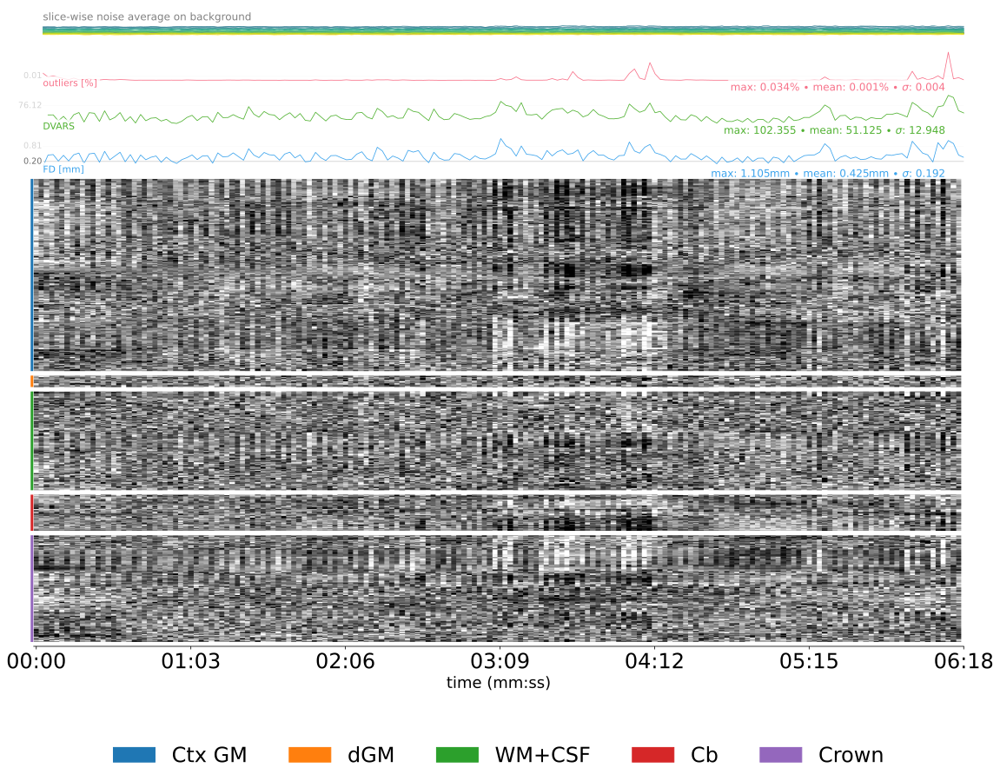

In [19]:
SVG(filename='./MRIQC/sub-CON02/figures/sub-CON02_ses-preop_task-rest_desc-carpet_bold.svg')

### 4.2 Core Neuroimaging Tools (Command-Line Interfaces)

The following tools are widely used in neuroimaging research and are typically run from the command line. They support key tasks in structural, functional, and diffusion imaging workflows. Many are integrated into higher-level toolkits like Nipype or fMRIPrep.

In [20]:
# create an output directory
!mkdir -p output

#### FreeSurfer's SynthStrip: Brain extraction of the anatomical image
Another interactive example can be found here: [recon-all](https://neurodesk.org/edu/examples/structural_imaging/freesurfer.html)

In [21]:
# SynthStrip
! mri_synthstrip -i ./ds001226/sub-CON02/ses-preop/anat/sub-CON02_ses-preop_T1w.nii.gz -o ./output/synth_stripped.nii.gz -m ./output/synth_mask.nii.gz

Configuring model on the CPU
Running SynthStrip model version 1
Input image read from: ./ds001226/sub-CON02/ses-preop/anat/sub-CON02_ses-preop_T1w.nii.gz
Processing frame (of 1): 1 done
Masked image saved to: ./output/synth_stripped.nii.gz
Binary brain mask saved to: ./output/synth_mask.nii.gz

If you use SynthStrip in your analysis, please cite:
----------------------------------------------------
SynthStrip: Skull-Stripping for Any Brain Image
A Hoopes, JS Mora, AV Dalca, B Fischl, M Hoffmann
NeuroImage 206 (2022), 119474
https://doi.org/10.1016/j.neuroimage.2022.119474

Website: https://synthstrip.io



#### AFNI's 3dvolreg: Motion Correction of functional data
For a complete example about preprocessing and glm, have a look at this [AFNI Preprocessing and GLM](https://neurodesk.org/edu/examples/functional_imaging/AFNI_preprocessing_plus_glm.html) notebook.

In [22]:
# 3dvolreg
! 3dvolreg -verbose -zpad 1 -cubic -base 0 -prefix ./output/epi_volreg.nii.gz  -1Dfile ./output/motion.1D ./ds001226/sub-CON02/ses-preop/func/sub-CON02_ses-preop_task-rest_bold.nii.gz

++ 3dvolreg: AFNI version=AFNI_21.2.00 (Jul  8 2021) [64-bit]
++ Authored by: RW Cox
*+ WARNING:   If you are performing spatial transformations on an oblique dset,
  such as ./ds001226/sub-CON02/ses-preop/func/sub-CON02_ses-preop_task-rest_bold.nii.gz,
  or viewing/combining it with volumes of differing obliquity,
  you should consider running: 
     3dWarp -deoblique 
  on this and  other oblique datasets in the same session.
 See 3dWarp -help for details.
++ Oblique dataset:./ds001226/sub-CON02/ses-preop/func/sub-CON02_ses-preop_task-rest_bold.nii.gz is 8.917687 degrees from plumb.
++ Reading input dataset ./ds001226/sub-CON02/ses-preop/func/sub-CON02_ses-preop_task-rest_bold.nii.gz
++ Edging: x=3 y=3 z=2
++ Creating mask for -maxdisp
 + Automask has 50248 voxels
 + 6670 voxels left in -maxdisp mask after erosion
++ Initializing alignment base
++ Starting final pass on 180 sub-bricks: 0..1..2..3..4..5..6..7..8..9..10..11..12..13..14..15..16..17..18..19..20..21..22..23..24..25..26..2

#### FSL: Registration of the anatomical image to MNI 
A detailed example notebook about [FSL Preprocessing and GLM](https://neurodesk.org/edu/examples/functional_imaging/FSL_preproc_glm.html) is also available.

In [23]:
fsl_path = !which fsl
fsl_version = fsl_path[0].split('_')[1]

MNI_BRAIN = os.path.join(
    '/opt',
    f'fsl-{fsl_version}',
    'data',
    'standard',
    'MNI152_T1_2mm_brain.nii.gz'
)

print(MNI_BRAIN)

/opt/fsl-6.0.7.16/data/standard/MNI152_T1_2mm_brain.nii.gz


In [24]:
# Register the T1w image to the MNI template (default: dof 12, normal search)
!flirt -in ./output/synth_stripped.nii.gz -ref "{MNI_BRAIN}" -out ./output/synth_stripped_flirt_T1MNI.nii.gz -omat ./output/synth_stripped_flirt_T1MNI.mat

#### MRTrix: Denoising diffusion data
There is a series of 3 notebooks about MRTrix: Part 1 - Preprocessing can be found [here](https://neurodesk.org/edu/examples/diffusion_imaging/MRtrix_1.html).

In [25]:
# converts diffusion data to a format that MRtrix understands
! mrconvert ./ds001226/sub-CON02/ses-preop/dwi/sub-CON02_ses-preop_acq-AP_dwi.nii.gz ./output/sub-02_dwi.mif -fslgrad ./ds001226/sub-CON02/ses-preop/dwi/sub-CON02_ses-preop_acq-AP_dwi.bvec ./ds001226/sub-CON02/ses-preop/dwi/sub-CON02_ses-preop_acq-AP_dwi.bval

mrconvert: [100%] uncompressing image "./ds001226/sub-CON02/ses-preop/dwi/sub-CON02_ses-preop_acq-AP_dwi.nii.gz"[0K
mrconvert: [100%] copying from "./ds001226...ses-preop_acq-AP_dwi.nii.gz" to "./output/sub-02_dwi.mif"[0K


In [26]:
# denoising
! dwidenoise ./output/sub-02_dwi.mif ./output/sub-02_den.mif -noise ./output/noise.mif

dwidenoise: [100%] preloading data for "./output/sub-02_dwi.mif"[0K
dwidenoise: [100%] running MP-PCA denoising[0K


### 4.3 Pythonic Interfaces and Python Toolkits for Neuroimaging

#### Nipype
Nipype is a flexible Python-based workflow engine that enables users to build reproducible, modular pipelines by integrating diverse neuroimaging tools under a consistent interface. We will explore how it wraps individual tools such as `fsl.BET()` and `afni.Edge3()` directly from Python code.

An overview of Nipype and how to build pipelines can be found in [Nipype on Neurodesk](https://neurodesk.org/edu/examples/workflows/nipype_full.html).

In [27]:
# this makes it so FSL knows how we want our output files
os.environ["FSLOUTPUTTYPE"]="NIFTI_GZ"

btr = fsl.BET()
btr.inputs.in_file = './ds001226/sub-CON02/ses-preop/anat/sub-CON02_ses-preop_T1w.nii.gz'
btr.inputs.frac = 0.4
btr.inputs.out_file = './output/nipype_bet.nii.gz'
res = btr.run() 

In [28]:
edge3 = afni.Edge3()
edge3.inputs.in_file = './ds001226/sub-CON02/ses-preop/anat/sub-CON02_ses-preop_T1w.nii.gz'
edge3.inputs.out_file = './output/nipype_afni_edges.nii.gz'
edge3.inputs.datum = 'byte'
res = edge3.run()

260213-06:52:54,994 nipype.interface INFO:
	 stderr 2026-02-13T06:52:54.994053:++ 3dedge3: AFNI version=AFNI_21.2.00 (Jul  8 2021) [64-bit]
260213-06:52:55,1 nipype.interface INFO:
	 stderr 2026-02-13T06:52:55.001032:*+ WARNING:   If you are performing spatial transformations on an oblique dset,
260213-06:52:55,1 nipype.interface INFO:
	 stderr 2026-02-13T06:52:55.001032:  such as ds001226/sub-CON02/ses-preop/anat/sub-CON02_ses-preop_T1w.nii.gz,
260213-06:52:55,2 nipype.interface INFO:
	 stderr 2026-02-13T06:52:55.001032:  or viewing/combining it with volumes of differing obliquity,
260213-06:52:55,2 nipype.interface INFO:
	 stderr 2026-02-13T06:52:55.001032:  you should consider running: 
260213-06:52:55,3 nipype.interface INFO:
	 stderr 2026-02-13T06:52:55.001032:     3dWarp -deoblique 
260213-06:52:55,3 nipype.interface INFO:
	 stderr 2026-02-13T06:52:55.001032:  on this and  other oblique datasets in the same session.
260213-06:52:55,4 nipype.interface INFO:
	 stderr 2026-02-13T06:

#### ANTsPy
ANTsPy is a Python wrapper for the widely-used ANTs (Advanced Normalization Tools) C++ biomedical image processing library. It offers fast reading and writing of medical images, advanced algorithms for image registration, segmentation, and statistical learning, as well as tools for generating publication-quality visualizations.

##### Segmentation
The segmentation module provides methods such as Atropos segmentation, Joint Label Fusion, cortical thickness estimation, and prior-based segmentation.

*Atropos segmentation:*

dict_keys(['segmentation', 'probabilityimages'])


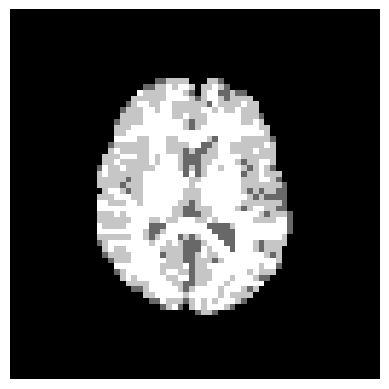

In [29]:
img = ants.image_read(ants.get_ants_data('r16'))
img = ants.resample_image(img, (64,64), 1, 0)
mask = ants.get_mask(img)
img_seg = ants.atropos(a=img, m='[0.2,1x1]', c='[2,0]', 
                       i='kmeans[3]', x=mask)
print(img_seg.keys())
ants.plot(img_seg['segmentation'])

*Cortical thickness*

ANTsImage
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256)
	 Spacing    : (1.0, 1.0)
	 Origin     : (0.0, 0.0)
	 Direction  : [1. 0. 0. 1.]



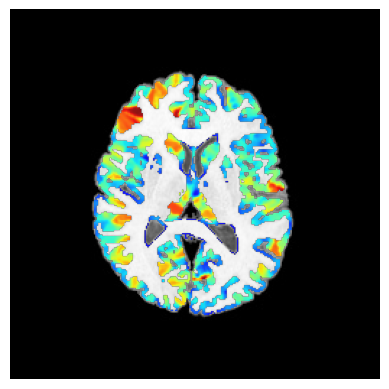

In [30]:
img = ants.image_read(ants.get_ants_data('r16'),2)
mask = ants.get_mask(img).threshold_image(1, 2)
segs = ants.atropos(a=img, m='[0.2,1x1]', c='[2,0]', i='kmeans[3]', x= mask)
thickimg = ants.kelly_kapowski(s=segs['segmentation'], g=segs['probabilityimages'][1],
                            w=segs['probabilityimages'][2], its=45, 
                            r=0.5, m=1)
print(thickimg)
img.plot(overlay=thickimg, overlay_cmap='jet')

##### Registration
The registration module features the core ANTs registration interface, enabling access to all registration algorithms. It also includes utilities for evaluating registration quality, resampling and reorienting images, and applying specific transformations.

*Symmetric Normalization (SyN)*

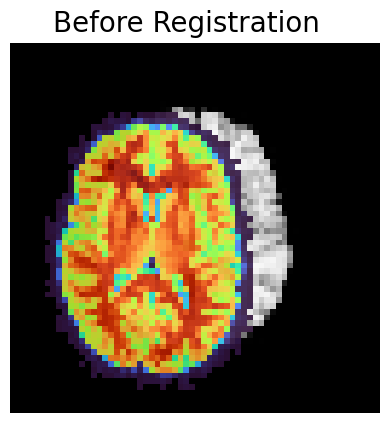

{'warpedmovout': ANTsImage
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (64, 64)
	 Spacing    : (4.0476, 4.0476)
	 Origin     : (0.0, 0.0)
	 Direction  : [1. 0. 0. 1.]
, 'warpedfixout': ANTsImage
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (64, 64)
	 Spacing    : (4.0476, 4.0476)
	 Origin     : (0.0, 0.0)
	 Direction  : [1. 0. 0. 1.]
, 'fwdtransforms': ['/tmp/tmpg_89h5pg1Warp.nii.gz', '/tmp/tmpg_89h5pg0GenericAffine.mat'], 'invtransforms': ['/tmp/tmpg_89h5pg0GenericAffine.mat', '/tmp/tmpg_89h5pg1InverseWarp.nii.gz']}


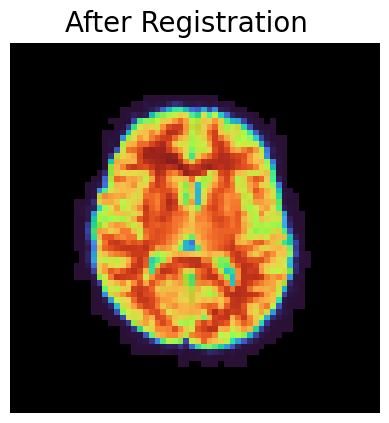

In [31]:
fixed = ants.image_read(ants.get_ants_data('r16')).resample_image((64,64),1,0)
moving = ants.image_read(ants.get_ants_data('r64')).resample_image((64,64),1,0)
fixed.plot(overlay=moving, title='Before Registration')
mytx = ants.registration(fixed=fixed , moving=moving, type_of_transform='SyN' )
print(mytx)
warped_moving = mytx['warpedmovout']
fixed.plot(overlay=warped_moving,title='After Registration')

#### DIPY - Reconstruction of the diffusion signal with DTI (single tensor) model
DIPY (Diffusion Imaging in Python) is a comprehensive library for processing and analyzing 3D and 4D medical imaging data. As part of the NiPy ecosystem, it provides robust tools for spatial normalization, denoising, tractography, and advanced diffusion modeling. In this section, we focus on reconstructing the diffusion signal using the classic Diffusion Tensor Imaging (DTI) model — a foundational approach for estimating white matter structure.

In [32]:
# Get data
fdwi = './ds001226/sub-CON02/ses-preop/dwi/sub-CON02_ses-preop_acq-AP_dwi.nii.gz'
fbval = './ds001226/sub-CON02/ses-preop/dwi/sub-CON02_ses-preop_acq-AP_dwi.bval'
fbvec =  './ds001226/sub-CON02/ses-preop/dwi/sub-CON02_ses-preop_acq-AP_dwi.bvec'

data, affine, img = load_nifti(fdwi, return_img=True)
print(data.shape)
print(img.header.get_zooms()[:3])

(96, 96, 60, 102)
(np.float32(2.5), np.float32(2.5), np.float32(2.5))


In [33]:
# Load the b-values and b-vectors
bvals, bvecs = read_bvals_bvecs(fbval, fbvec)
gtab = gradient_table(bvals, bvecs=bvecs)
print(gtab.info)

B-values shape (102,)
         min 0.000000
         max 2800.000000
B-vectors shape (102, 3)
          min -0.998927
          max 0.997386

None


In [34]:
# Mask and crop the data
maskdata, mask = median_otsu(
    data, vol_idx=range(10, 50), median_radius=3, numpass=1, autocrop=True, dilate=2
)
print(f"maskdata.shape {maskdata.shape}")

maskdata.shape (59, 73, 55, 102)


In [35]:
# Instantiate the Tensor model and fit the masked data
tenmodel = dti.TensorModel(gtab)
tenfit = tenmodel.fit(maskdata)

In [36]:
# Initialize a NIfTI header and set its intent to 'vector' to indicate multi-component data (e.g., DEC map)
hdr = nib.Nifti1Header()
hdr.set_intent('vector') 
hdr['intent_name'] = b'RGB'

# Compute the color FA map (also known as the DEC map) from the diffusion tensor model,
# and save it as a NIfTI image with the appropriate vector metadata
img = nib.Nifti1Image(tenfit.color_fa, affine, header=hdr)
nib.save(img, './output/colorfa.nii.gz')

In [37]:
# Fit the tensor Orientation Distribution Functions on a subset of the data
sphere = get_sphere(name="repulsion724")
tensor_odfs = tenmodel.fit(data[25:60, 30:70, 29:30]).odf(sphere) 

scene = window.Scene()
odf_actor = actor.odf_slicer(tensor_odfs, sphere=sphere, scale=0.5, colormap=None)

scene.add(odf_actor)
# Save a snapshot of the rendered scene as a PNG image to display it in a later step or to share it outside the notebook
window.record(scene=scene, n_frames=1, out_path="./output/tensor_odfs.png", size=(600, 600))

## 5. Visualization: The Art of Brain Mapping

### DIPY 
#### Visualizing Tensor Orientation Distributions with DIPY and IPython

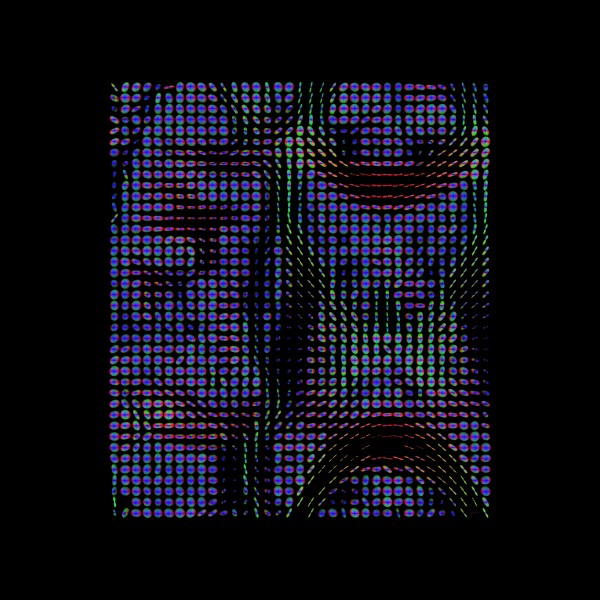

In [38]:
display(Image(filename='./output/tensor_odfs.png'))

#### Creating a mosaic plot

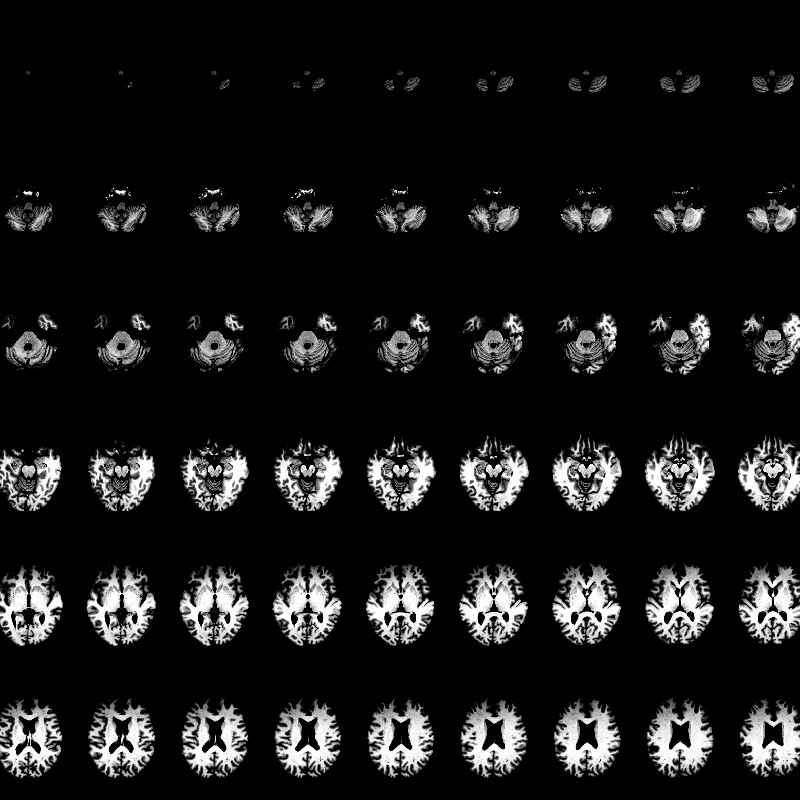

In [39]:
t1_nipype = './output/nipype_bet.nii.gz'
data, affine = load_nifti(t1_nipype)

#Render slices from T1 with a specific value range
mean, std = data[data > 0].mean(), data[data > 0].std()
value_range = (mean - 0.5 * std, mean + 1.5 * std)

slice_actor = actor.slicer(data, affine=affine, value_range=value_range)
scene = window.Scene()
scene.clear()
scene.projection(proj_type="parallel")
cnt = 0

X, Y, Z = slice_actor.shape[:3]

rows, cols, border = 20, 15, 5

for j in range(rows):
    for i in range(cols):
        slice_mosaic = slice_actor.copy()
        slice_mosaic.display(z=cnt)
        slice_mosaic.SetPosition(
            (X + border) * i, 0.5 * cols * (Y + border) - (Y + border) * j, 0
        )
        slice_mosaic.SetInterpolate(False)
        scene.add(slice_mosaic)
        cnt += 1
        if cnt > Z:
            break
    if cnt > Z:
        break

scene.reset_camera()
scene.zoom(3.5) #zoom in

window.record(scene=scene, out_path="./output/mosaic.png", size=(800, 800), reset_camera=False)
display(Image(filename='./output/mosaic.png'))

### Matplotlib
#### Brain slices

In [40]:
# View 3D data
def view_slices_3d(image_3d, slice_nbr, vmin, vmax, title=''):
  fig = plt.figure(figsize=(15, 4))
  plt.suptitle(title, fontsize=14)

  plt.subplot(131)
  plt.imshow(np.take(image_3d, slice_nbr, 2), vmin=vmin, vmax=vmax, cmap='gray')
  plt.title('Axial', fontsize=10);

  plt.subplot(132)
  image_rot = ndimage.rotate(np.take(image_3d, slice_nbr, 1),90)
  plt.imshow(image_rot, vmin=vmin, vmax=vmax, cmap='gray')
  plt.title('Coronal', fontsize=10);

  plt.subplot(133)
  image_rot = ndimage.rotate(np.take(image_3d, slice_nbr, 0),90)
  plt.imshow(image_rot, vmin=vmin, vmax=vmax, cmap='gray')
  plt.title('Sagittal', fontsize=10);
  cbar=plt.colorbar()


In [41]:
# load data
brain_full = nib.load('./ds001226/sub-CON02/ses-preop/anat/sub-CON02_ses-preop_T1w.nii.gz').get_fdata()
brain_edges = nib.load('./output/nipype_afni_edges.nii.gz').get_fdata()

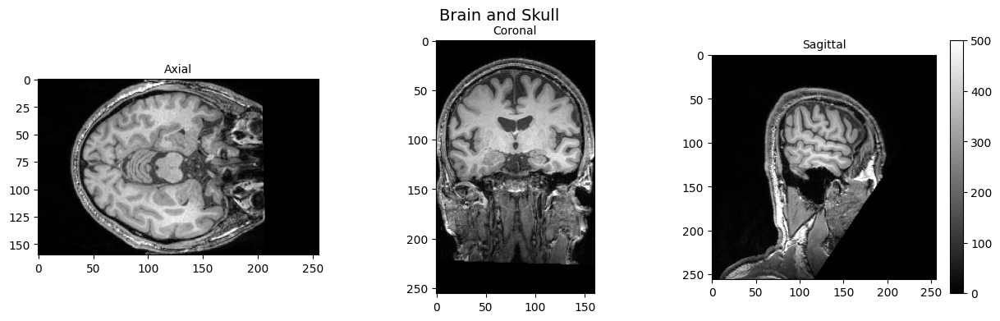

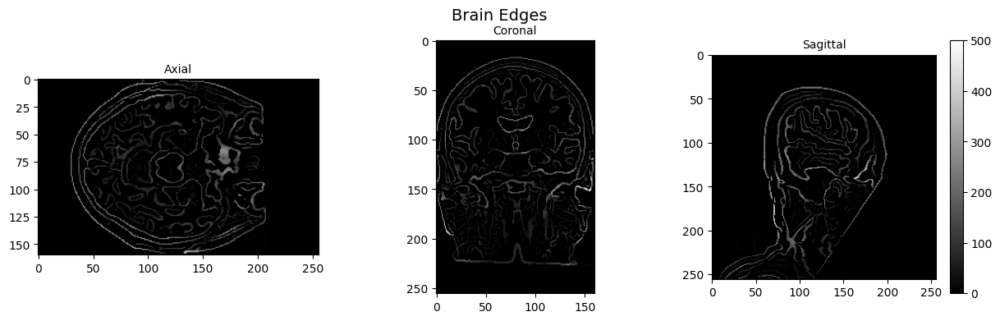

In [42]:
view_slices_3d(brain_full, slice_nbr=135, vmin=0, vmax=500, title='Brain and Skull')
view_slices_3d(brain_edges, slice_nbr=135, vmin=0, vmax=500, title='Brain Edges')

#### Motion parameters

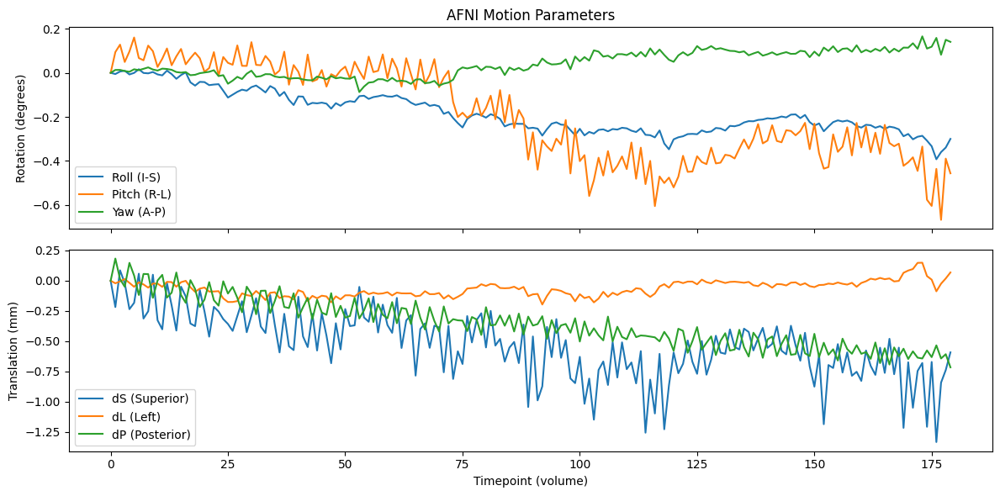

In [43]:
# Load AFNI motion parameters (roll, pitch, yaw, dS, dL, dP)
motion_params = np.loadtxt('./output/motion.1D')
timepoints = np.arange(motion_params.shape[0])

# Plotting
fig, axs = plt.subplots(2, 1, figsize=(12, 6), sharex=True)

# Rotations in degrees
axs[0].plot(timepoints, motion_params[:, 0], label='Roll (I-S)')
axs[0].plot(timepoints, motion_params[:, 1], label='Pitch (R-L)')
axs[0].plot(timepoints, motion_params[:, 2], label='Yaw (A-P)')
axs[0].set_ylabel('Rotation (degrees)')
axs[0].legend()
axs[0].set_title('AFNI Motion Parameters')

# Translations in mm
axs[1].plot(timepoints, motion_params[:, 3], label='dS (Superior)')
axs[1].plot(timepoints, motion_params[:, 4], label='dL (Left)')
axs[1].plot(timepoints, motion_params[:, 5], label='dP (Posterior)')
axs[1].set_ylabel('Translation (mm)')
axs[1].set_xlabel('Timepoint (volume)')
axs[1].legend()

plt.tight_layout()
plt.show()

### Nilearn

#### plot_epi
Plot cuts of an EPI image

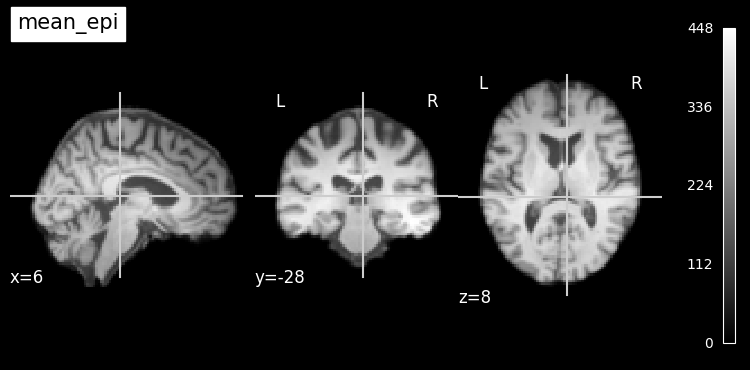

In [44]:
mean_epi = mean_img('./output/synth_stripped_flirt_T1MNI.nii.gz', copy_header=True)
plot_epi(mean_epi, colorbar=True, cbar_tick_format="%i", title="mean_epi")

#### plot_anat and `add_edges` to see the overlay between two images

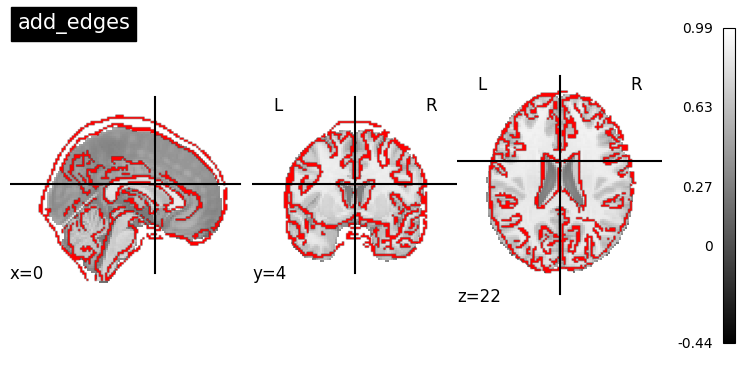

In [45]:
# Check registration by overlaying anatomical image as edges (red) on top of mni template
t1_mni = './output/synth_stripped_flirt_T1MNI.nii.gz'
disp_edges = plot_anat(title="add_edges") #default=MNI152TEMPLATE
disp_edges.add_edges(t1_mni, color="r")

#### plot_roi
Plot cuts of an ROI/mask image

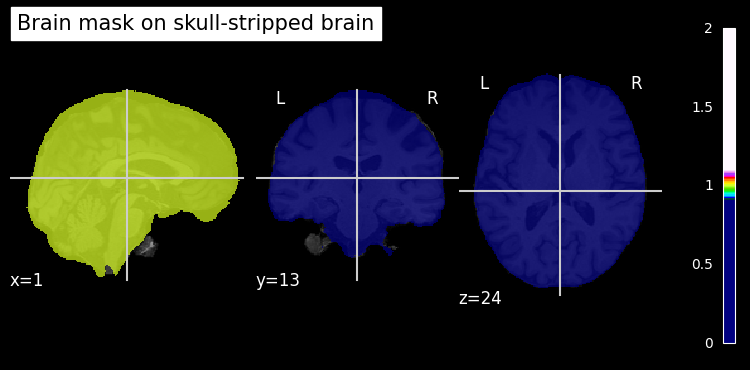

In [46]:
plot_roi('./output/synth_mask.nii.gz', bg_img=t1_nipype, 
         title='Brain mask on skull-stripped brain')


#### view_img
Interactive html viewer

/opt/conda/lib/python3.13/site-packages/numpy/_core/fromnumeric.py:867: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



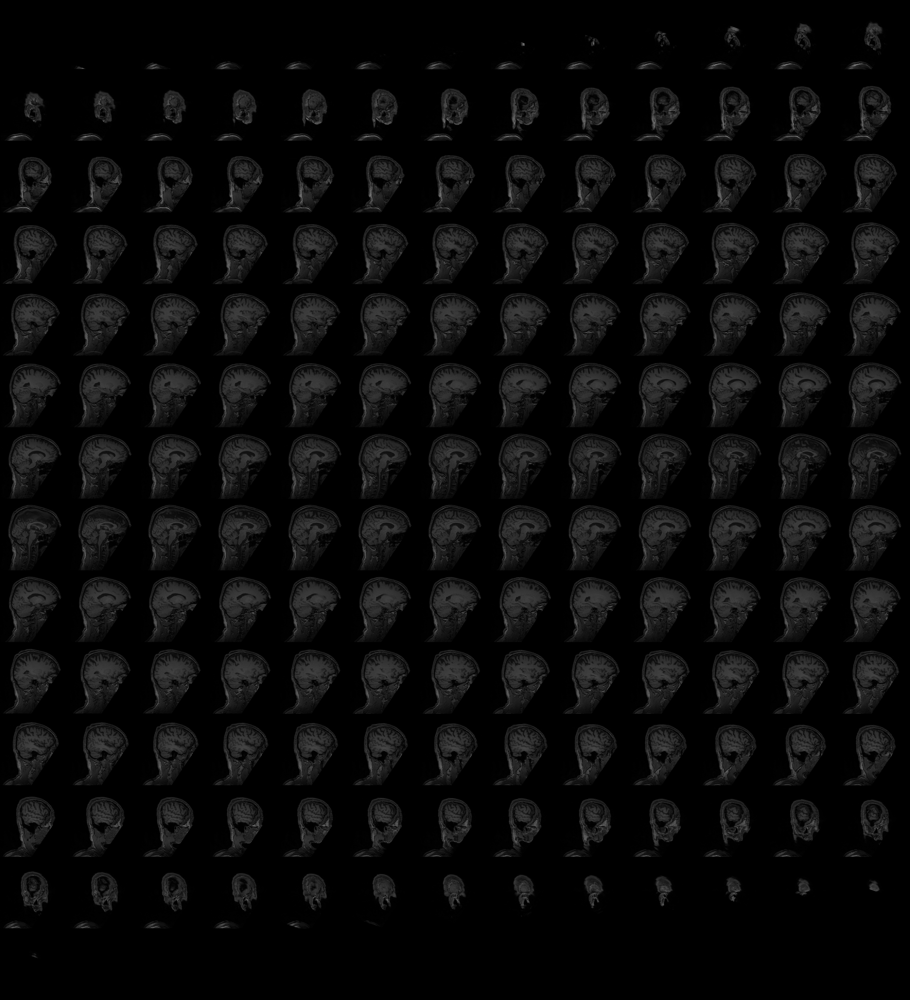
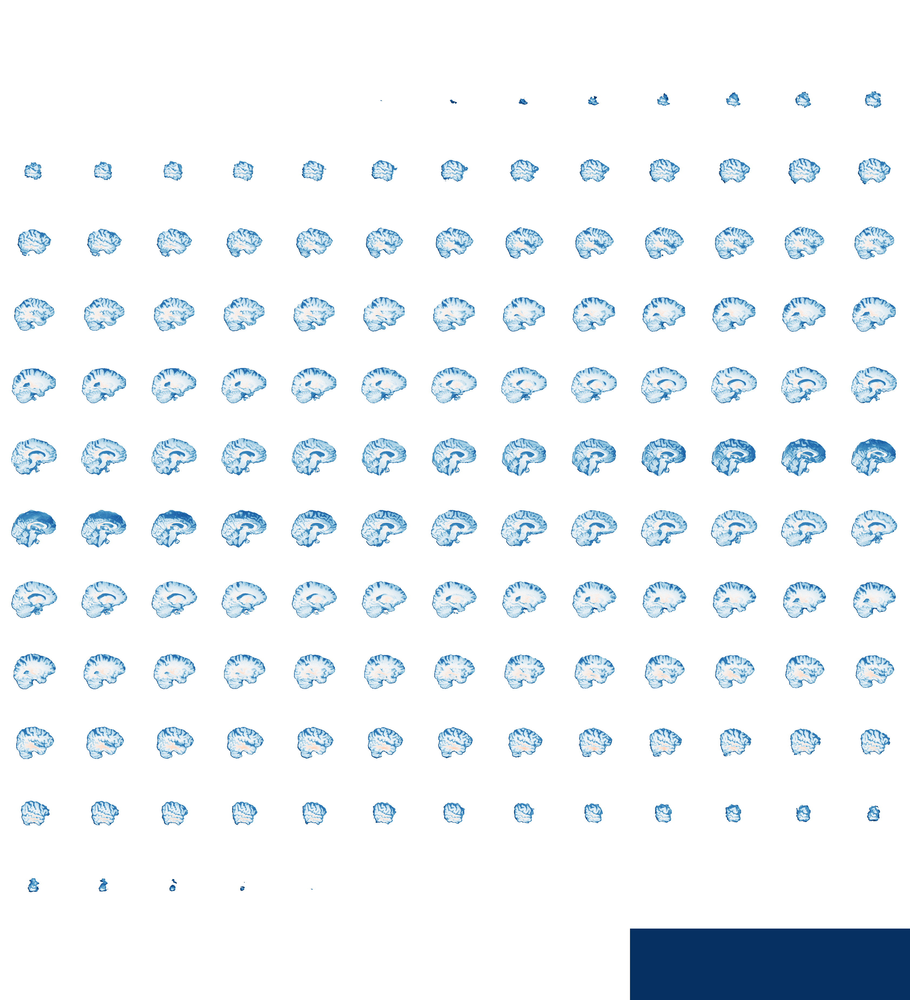

In [47]:
view_img(t1_nipype, bg_img='./ds001226/sub-CON02/ses-preop/anat/sub-CON02_ses-preop_T1w.nii.gz', 
         symmetric_cmap=False)

### ipyniivue

#### Visualize the skull-stripped brain

In [48]:
from ipyniivue import NiiVue
nv = NiiVue()
nv.load_volumes([{"path": './output/synth_stripped.nii.gz'}])
nv

/opt/conda/lib/python3.13/site-packages/traitlets/traitlets.py:842: DeprecationWarning: Deprecated in traitlets 4.1, use the instance .metadata dictionary directly, like x.metadata[key] or x.metadata.get(key, default)
  warn("Deprecated in traitlets 4.1, " + msg, DeprecationWarning, stacklevel=2)


#### Visualize the FA image (DEC map)

In [50]:
nv = NiiVue()
nv.load_volumes([{"path": "./output/colorfa.nii.gz"}])
nv

#### Dependencies in Jupyter/Python
- Using the package [watermark](https://github.com/rasbt/watermark) to document system environment and software versions used in this notebook

In [52]:
%load_ext watermark

%watermark
%watermark --iversions

Last updated: 2026-02-13T06:54:51.103078+00:00

Python implementation: CPython
Python version       : 3.13.9
IPython version      : 9.7.0

Compiler    : GCC 14.3.0
OS          : Linux
Release     : 5.15.0-164-generic
Machine     : x86_64
Processor   : x86_64
CPU cores   : 32
Architecture: 64bit

IPython       : 9.7.0
ants          : 0.6.1
bids          : 0.19.0
bids_validator: 1.14.7.post0
dipy          : 1.11.0
fury          : 0.11.0
ipyniivue     : 2.4.4
matplotlib    : 3.10.8
nibabel       : 5.3.3
nilearn       : 0.13.1
nipype        : 1.10.0
numpy         : 2.3.5
scipy         : 1.15.3

